<a href="https://colab.research.google.com/github/huynhdangthanhtam/Super-resolution-and-Inpainting-Image-with-U-Net/blob/main/Super_resolution_and_Inpainting_Image_with_U_Net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem 1: Xây dựng mô hình kiến trúc U-Net

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf

class BuildUnet():
    def __init__(self):
        pass
    
    def extract_first_features(self, filters, size):
        initializer = tf.random_normal_initializer(0., 0.02)

        result = tf.keras.Sequential()
        result.add(tf.keras.layers.Conv2D(filters, size, strides=1, padding='same',
                                          kernel_initializer=initializer, use_bias=False))
        result.add(tf.keras.layers.LeakyReLU())

        return result

    def downsample(self, filters):
        initializer = tf.random_normal_initializer(0., 0.02)

        result = tf.keras.Sequential()
        # your code here
        result.add(tf.keras.layers.Conv2D(filters, 4, strides = 2,  padding='same', kernel_initializer= initializer))
        result.add(tf.keras.layers.LeakyReLU())

        return result

    def upsample(self, filters):
        initializer = tf.random_normal_initializer(0., 0.02)

        result = tf.keras.Sequential()
        # your code here
        result.add(tf.keras.layers.UpSampling2D(interpolation='bilinear'))
        result.add(tf.keras.layers.Conv2D(filters, 3, strides = 1,  padding='same', kernel_initializer= initializer))
        result.add(tf.keras.layers.ReLU())

        return result
    
    def UNet_process(self, x, is_skip_connection=True):
        down_stack = [
            # your code here
            self.downsample(64),  # (bs, 128, 128, 64)
            self.downsample(256), # (bs, 64, 64, 256)
            self.downsample(512), # (bs, 32, 32, 512)
            self.downsample(512), # (bs, 16, 16, 512)
            self.downsample(512)
        ]

        up_stack = [
            # your code here
            self.upsample(512),
            self.upsample(512),
            self.upsample(256),
            self.upsample(64)
           
        ]

        initializer = tf.random_normal_initializer(0., 0.02, seed=42)
        OUTPUT_CHANNELS = 3

        sample_l = tf.keras.layers.UpSampling2D(interpolation='bilinear')
        last = tf.keras.layers.Conv2D(OUTPUT_CHANNELS, 3, padding='same', activation='tanh',
                                      kernel_initializer=initializer, use_bias=False)

        concat = tf.keras.layers.Concatenate()

        # Downsampling through the model
        skips = []
        for down in down_stack:
            x = down(x)
            skips.append(x)

        skips = reversed(skips[:-1])

        # Upsampling and establishing the skip connections
        for up, skip in zip(up_stack, skips):
            x = up(x)
            if is_skip_connection:
                x = concat([x, skip])

        x = sample_l(x)
        x = last(x)

        return x
    
    def build_model(self, is_skip_connection=True, input_shape=(256, 256, 3)): 
        # multiple inputs
        inputs = tf.keras.layers.Input(shape=input_shape)

        x = inputs

        # ablation study 1
        fextract1 = self.extract_first_features(64, 3)
        x = fextract1(x) # (1,256,256,64)

        outputs = self.UNet_process(x, is_skip_connection=is_skip_connection)    

        return tf.keras.Model(inputs=[inputs], outputs=[outputs])

In [3]:
build_unet = BuildUnet()
unet_model = build_unet.build_model(is_skip_connection=True)

unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 256, 256, 64  1728        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_1 (Sequential)      (None, 128, 128, 64  65600       ['sequential[0][0]']             
                                )                                                             

# Problem 2:

## Prepare Super Resolution Dataset

In [4]:
import matplotlib.pyplot as plt
from keras import layers
from keras.models import Model

In [5]:
!unzip '/content/drive/MyDrive/Colab Notebooks/bài tập AIO/U-Net-Exercise 18_1_2023/K_LHR_image.zip'

Archive:  /content/drive/MyDrive/Colab Notebooks/bài tập AIO/U-Net-Exercise 18_1_2023/K_LHR_image.zip
   creating: K_LHR_image/
   creating: K_LHR_image/train/
  inflating: K_LHR_image/train/0.png  
  inflating: K_LHR_image/train/1.png  
  inflating: K_LHR_image/train/10.png  
  inflating: K_LHR_image/train/100.png  
  inflating: K_LHR_image/train/101.png  
  inflating: K_LHR_image/train/102.png  
  inflating: K_LHR_image/train/103.png  
  inflating: K_LHR_image/train/104.png  
  inflating: K_LHR_image/train/105.png  
  inflating: K_LHR_image/train/106.png  
  inflating: K_LHR_image/train/107.png  
  inflating: K_LHR_image/train/108.png  
  inflating: K_LHR_image/train/109.png  
  inflating: K_LHR_image/train/11.png  
  inflating: K_LHR_image/train/110.png  
  inflating: K_LHR_image/train/111.png  
  inflating: K_LHR_image/train/112.png  
  inflating: K_LHR_image/train/113.png  
  inflating: K_LHR_image/train/114.png  
  inflating: K_LHR_image/train/115.png  
  inflating: K_LHR_imag

In [6]:
!pwd

/content


In [7]:
LHR_TRAIN_DATA_PATH = '/content/K_LHR_image/train'
LHR_VAL_DATA_PATH = '/content/K_LHR_image/val'


BATCH_SIZE  = 32
BUFFER_SIZE = BATCH_SIZE*10
IMG_WIDTH   = 64
IMG_HEIGHT  = 64

def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image,channels=3)
        
    input_image  = tf.image.resize(image, (IMG_HEIGHT, IMG_WIDTH))
    target_image = image
    
    input_image  = tf.cast(input_image, tf.float32)
    target_image = tf.cast(target_image, tf.float32)

    # clip
    # input_image = tf.clip_by_value(input_image, 0.0, 255.0)


    return input_image, target_image

(64, 64, 3)
(256, 256, 3)


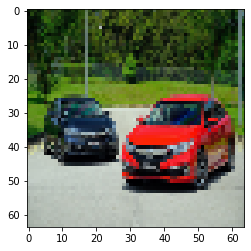

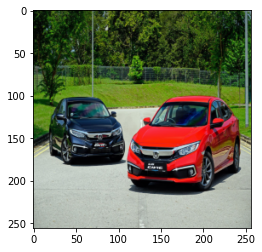

In [8]:
input_image, target_image = load(LHR_TRAIN_DATA_PATH+'/0.png')
print(input_image.shape)
print(target_image.shape)


# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(input_image/255.0)
plt.figure()
plt.imshow(target_image/255.0)

In [9]:
# normalizing the images to [-1, 1]
def normalize(input_image, target_image):
    # your code here
    input_image = (input_image / 127.5) -1
    target_image = (target_image / 127.5) -1

    return input_image, target_image

#@tf.function()
def random_jitter(input_image, target_image):
    if tf.random.uniform(()) > 0.5:
        input_image  = tf.image.flip_left_right(input_image)
        target_image = tf.image.flip_left_right(target_image)

    return input_image, target_image

def load_image_train(image_file):
    input_image, target_image = load(image_file)
    # input_image, target_image = random_jitter(input_image, target_image)
    input_image, target_image = normalize(input_image, target_image)

    return input_image, target_image

def load_image_test(image_file):
    input_image, target_image = load(image_file)
    input_image, target_image = normalize(input_image, target_image)

    return input_image, target_image

In [10]:
# train_dataset
train_dataset = tf.data.Dataset.list_files(LHR_TRAIN_DATA_PATH + '/*.png')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(1)

# test_dataset
test_dataset = tf.data.Dataset.list_files(LHR_VAL_DATA_PATH + '/*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

In [11]:
def generator_loss(fake, target):
    l1_loss = tf.reduce_mean(tf.abs(fake-target))
    
    return l1_loss

In [12]:
def evaluate(model, epoch):  
    psnr_mean = 0.0
    count = 0
    for inputs, targets in test_dataset:
        fake = model([inputs], training=True)
         
        psnr = tf.image.psnr(fake*0.5 + 0.5, targets*0.5 + 0.5, max_val=1.0)

        __psnr_mean = tf.math.reduce_mean(psnr)
        # psnr_mean = psnr_mean_l
        
        psnr_mean += __psnr_mean
        count =count + 1
    
    psnr_mean = psnr_mean/count
    print('-------- psnr: ', psnr_mean.numpy(), '   ----- epoch: ', epoch, '  count: ', count)
    
    return psnr_mean
    
def generate_images(model, inputs, targets):
    fake = model([inputs], training=True)
    plt.figure(figsize=(15,20))
    
    display_list = [inputs[0], targets[0], fake[0]]
    title = ['Input', 'Real', 'Predicted']    

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()        

## Train

In [13]:
build_unet = BuildUnet()
unet_model = build_unet.build_model(is_skip_connection=True)


image_input = layers.Input(shape=(IMG_HEIGHT,IMG_WIDTH,3))
x = tf.keras.layers.Resizing(height=256, width=256)(image_input)
x = unet_model(x)
SR_unet_model = Model(inputs=image_input, outputs=x)

SR_unet_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 resizing (Resizing)         (None, 256, 256, 3)       0         
                                                                 
 model_1 (Functional)        (None, 256, 256, 3)       20553920  
                                                                 
Total params: 20,553,920
Trainable params: 20,553,920
Non-trainable params: 0
_________________________________________________________________


In [14]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

@tf.function
def train_step(inputs, targets):
    with tf.GradientTape() as tape:
        # output
        fake = SR_unet_model([inputs], training=True)     
        loss = generator_loss(fake, targets)
        

    generator_gradients = tape.gradient(loss, SR_unet_model.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients, SR_unet_model.trainable_variables))
    
    return loss

    
    
def fit(train_ds, epochs, test_ds):
    best_pnsr = 0.0
    for epoch in range(epochs):
        # Train
        total_loss = 0.0
        for inputs, targets in train_ds:
            loss = train_step(inputs, targets)
            total_loss = total_loss + loss
        total_loss = total_loss/400
        print('epoch: {}   loss: {}'.format(epoch, total_loss))
        
        pnsr = evaluate(SR_unet_model, epoch)        
        if best_pnsr < pnsr:
            best_pnsr = pnsr
            
            for inputs, targets in test_ds.take(1):
                generate_images(SR_unet_model, inputs, targets)


epoch: 0   loss: 0.2271389216184616
-------- psnr:  22.903568    ----- epoch:  0   count:  170


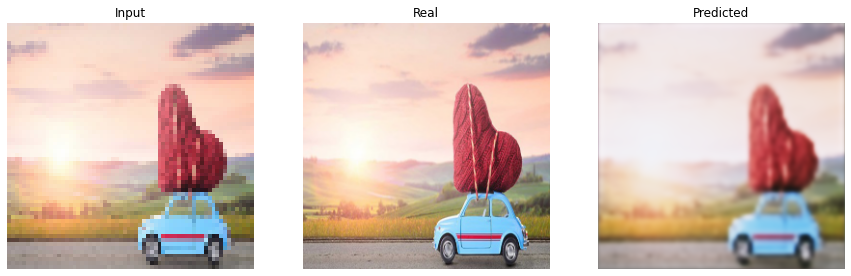

epoch: 1   loss: 0.1619732826948166
-------- psnr:  23.634138    ----- epoch:  1   count:  170


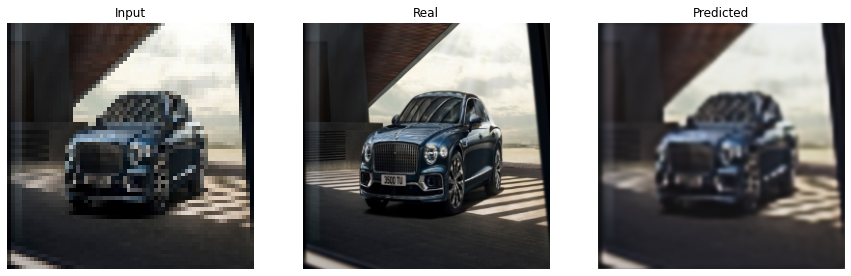

epoch: 2   loss: 0.15076866745948792
-------- psnr:  24.367891    ----- epoch:  2   count:  170


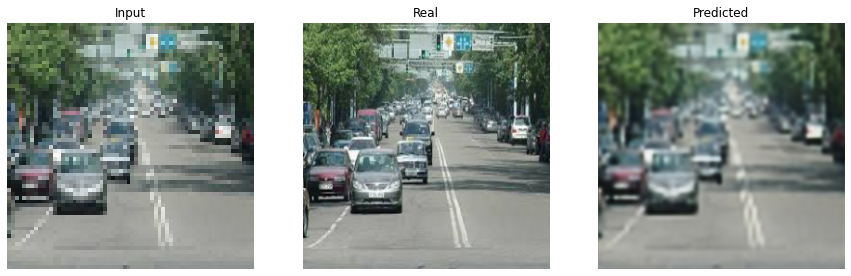

epoch: 3   loss: 0.14442288875579834
-------- psnr:  24.450598    ----- epoch:  3   count:  170


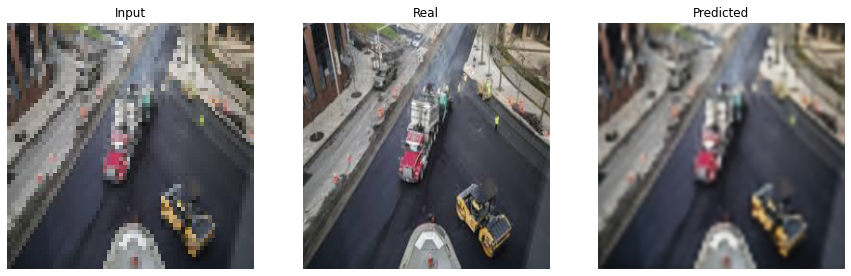

epoch: 4   loss: 0.14072421193122864
-------- psnr:  24.424105    ----- epoch:  4   count:  170
epoch: 5   loss: 0.13391190767288208
-------- psnr:  24.704805    ----- epoch:  5   count:  170


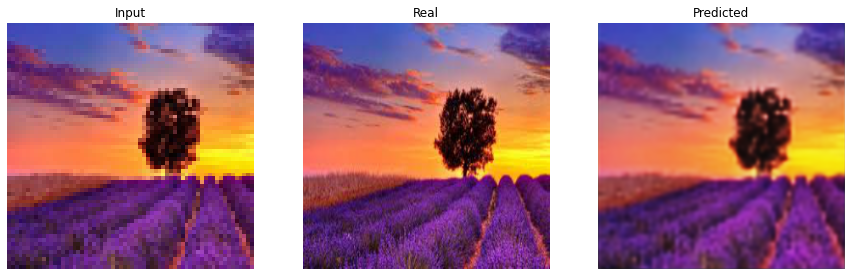

epoch: 6   loss: 0.13216301798820496
-------- psnr:  24.073668    ----- epoch:  6   count:  170
epoch: 7   loss: 0.13131596148014069
-------- psnr:  24.68962    ----- epoch:  7   count:  170
epoch: 8   loss: 0.12765517830848694
-------- psnr:  24.826801    ----- epoch:  8   count:  170


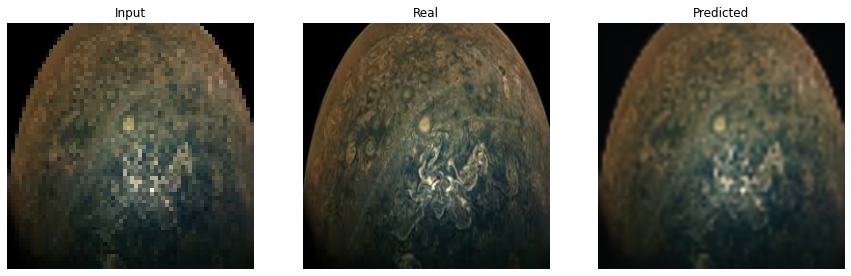

epoch: 9   loss: 0.12584279477596283
-------- psnr:  24.674782    ----- epoch:  9   count:  170
epoch: 10   loss: 0.1253795176744461
-------- psnr:  24.728582    ----- epoch:  10   count:  170
epoch: 11   loss: 0.12225014716386795
-------- psnr:  24.448465    ----- epoch:  11   count:  170
epoch: 12   loss: 0.12139692157506943
-------- psnr:  24.976812    ----- epoch:  12   count:  170


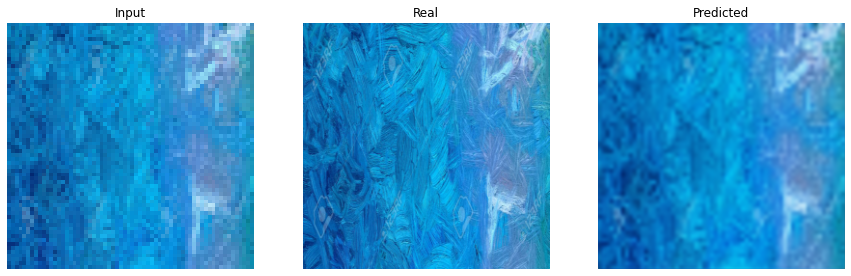

epoch: 13   loss: 0.12234802544116974
-------- psnr:  24.785099    ----- epoch:  13   count:  170
epoch: 14   loss: 0.12844860553741455
-------- psnr:  24.88346    ----- epoch:  14   count:  170
epoch: 15   loss: 0.12361624836921692
-------- psnr:  24.969296    ----- epoch:  15   count:  170
epoch: 16   loss: 0.11843647062778473
-------- psnr:  24.92283    ----- epoch:  16   count:  170
epoch: 17   loss: 0.11820724606513977
-------- psnr:  25.102982    ----- epoch:  17   count:  170


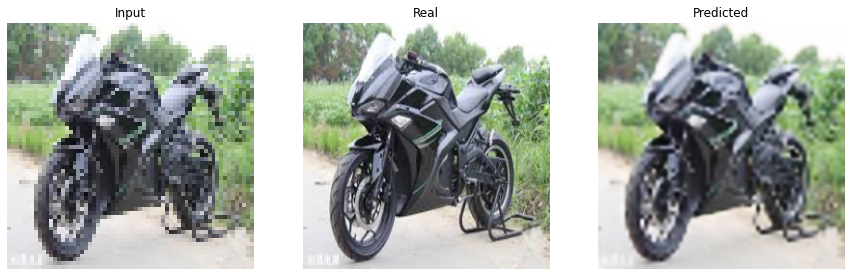

epoch: 18   loss: 0.11726320534944534
-------- psnr:  25.091417    ----- epoch:  18   count:  170
epoch: 19   loss: 0.11700817942619324
-------- psnr:  24.658709    ----- epoch:  19   count:  170
epoch: 20   loss: 0.1173233911395073
-------- psnr:  25.048452    ----- epoch:  20   count:  170
epoch: 21   loss: 0.11597571521997452
-------- psnr:  25.192286    ----- epoch:  21   count:  170


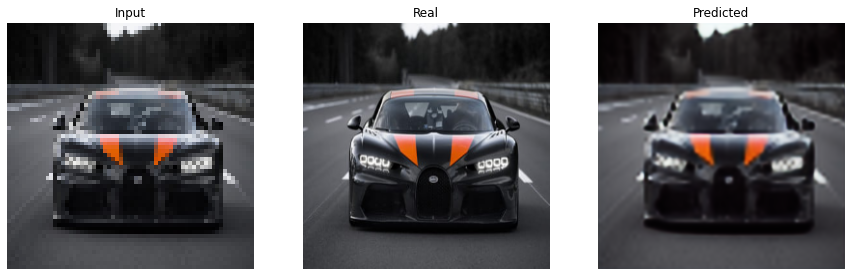

epoch: 22   loss: 0.11669240146875381
-------- psnr:  24.64398    ----- epoch:  22   count:  170
epoch: 23   loss: 0.1145077794790268
-------- psnr:  25.108591    ----- epoch:  23   count:  170
epoch: 24   loss: 0.11449182778596878
-------- psnr:  25.164959    ----- epoch:  24   count:  170
epoch: 25   loss: 0.11236682534217834
-------- psnr:  25.289833    ----- epoch:  25   count:  170


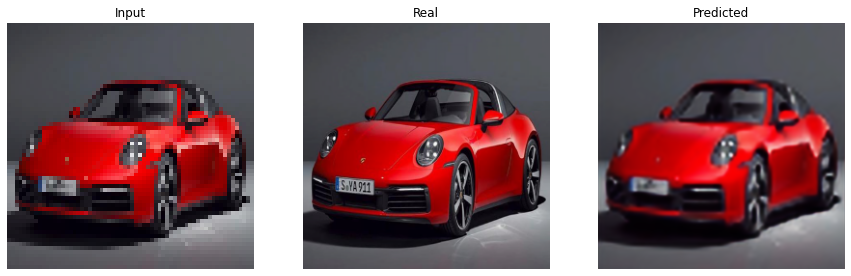

epoch: 26   loss: 0.11337736994028091
-------- psnr:  25.19814    ----- epoch:  26   count:  170
epoch: 27   loss: 0.11265041679143906
-------- psnr:  25.352398    ----- epoch:  27   count:  170


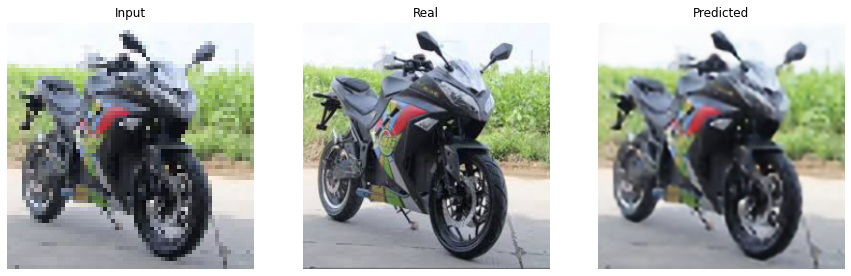

epoch: 28   loss: 0.11159837990999222
-------- psnr:  25.311388    ----- epoch:  28   count:  170
epoch: 29   loss: 0.11194378137588501
-------- psnr:  25.374409    ----- epoch:  29   count:  170


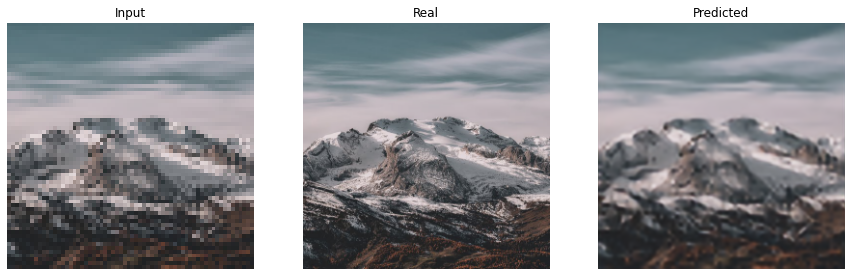

epoch: 30   loss: 0.11209937185049057
-------- psnr:  25.234886    ----- epoch:  30   count:  170
epoch: 31   loss: 0.11101631820201874
-------- psnr:  25.35892    ----- epoch:  31   count:  170
epoch: 32   loss: 0.11389119923114777
-------- psnr:  24.755875    ----- epoch:  32   count:  170
epoch: 33   loss: 0.11197131127119064
-------- psnr:  25.360516    ----- epoch:  33   count:  170
epoch: 34   loss: 0.12204825133085251
-------- psnr:  25.277275    ----- epoch:  34   count:  170
epoch: 35   loss: 0.1122858077287674
-------- psnr:  25.360529    ----- epoch:  35   count:  170
epoch: 36   loss: 0.10959706455469131
-------- psnr:  25.391607    ----- epoch:  36   count:  170


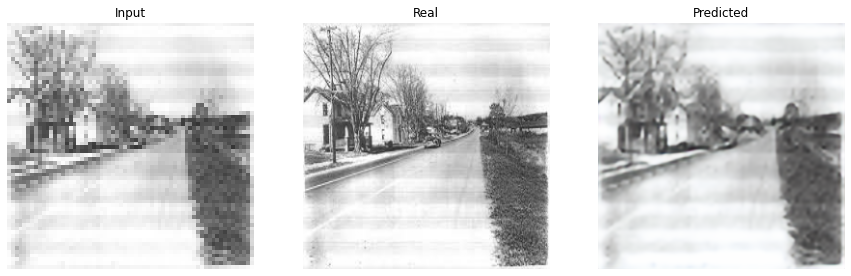

epoch: 37   loss: 0.10956710577011108
-------- psnr:  25.311216    ----- epoch:  37   count:  170
epoch: 38   loss: 0.11071567237377167
-------- psnr:  25.382261    ----- epoch:  38   count:  170
epoch: 39   loss: 0.10821539908647537
-------- psnr:  25.396906    ----- epoch:  39   count:  170


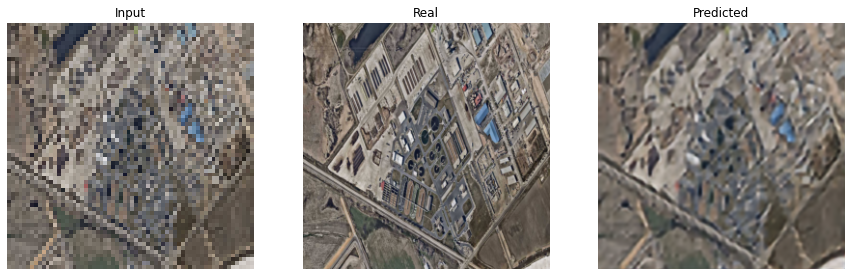

In [15]:
EPOCHS = 40
fit(train_dataset, EPOCHS, test_dataset)

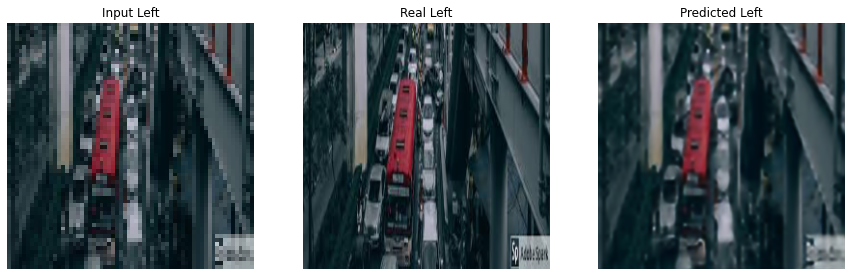

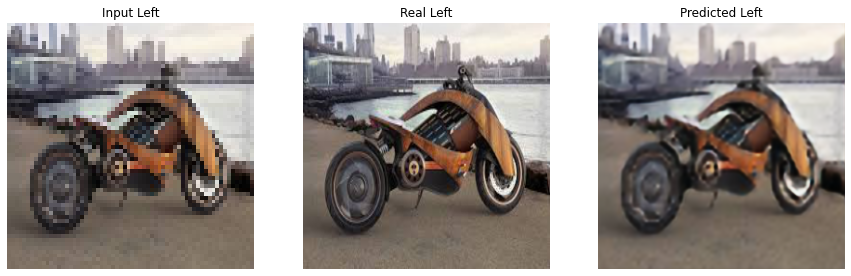

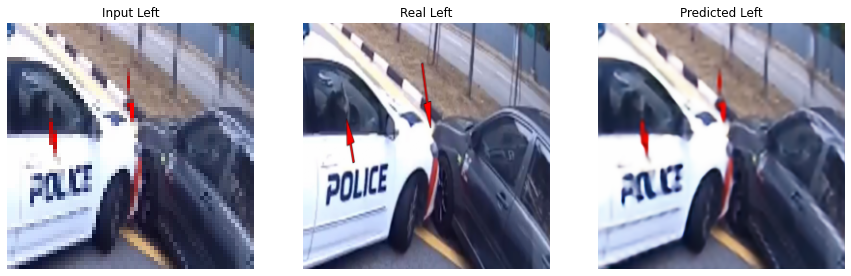

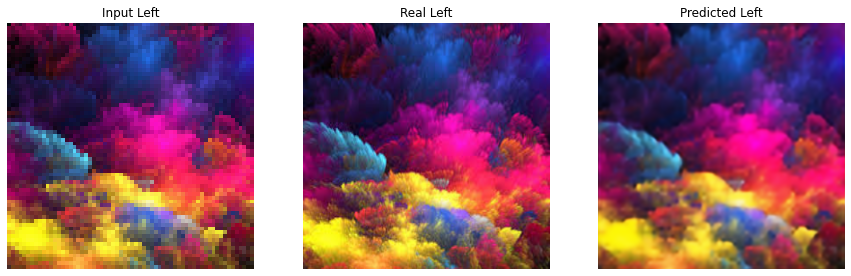

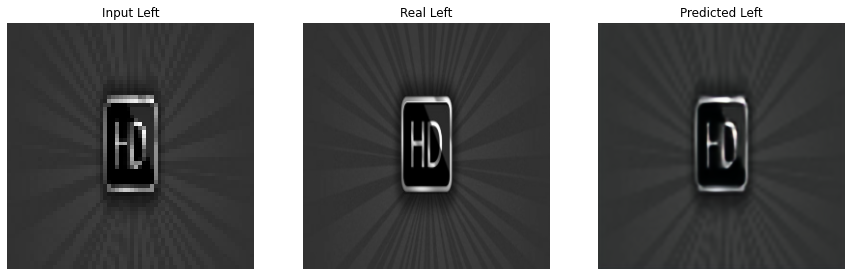

In [16]:
for _ in range(5):
    for inputs, targets in test_dataset.take(1):
        fake = SR_unet_model([inputs], training=True)
        plt.figure(figsize=(15,20))

        display_list = [inputs[0], targets[0], fake[0]]
        title = ['Input Left', 'Real Left', 'Predicted Left']    

        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
        plt.show() 

# Problem 3:

## U-Net model

In [17]:
class BuildUnet():
    def __init__(self):
        self.down_filters = [64, 128, 256, 512]
        self.up_filters = [512, 256, 128, 64]
    
    def extract_first_features(self, inputs, filters):
        # your code here
        x = layers.Conv2D(filters = filters, kernel_size=(1,1), padding='same', 
                          kernel_initializer='he_normal', use_bias=False)(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(filters = filters, kernel_size=(1,1), padding='same', 
                          kernel_initializer='he_normal', use_bias=False)(inputs)
        x = layers.BatchNormalization()(x)                  
        return x
    
    
    def DoubleConv2D(self, inputs, filters):
        x = layers.Conv2D(filters=filters, kernel_size=(3,3), padding='same', 
                          kernel_initializer='he_normal', use_bias=False)(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        
        # your code here
        x = layers.Conv2D(filters = filters, kernel_size = (3, 3), padding = 'same',
                          kernel_initializer='he_normal', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)                  
        return x
    
    
    def downsample(self, inputs, filters):
        bdown = self.DoubleConv2D(inputs, filters)
        x = layers.MaxPooling2D(pool_size=(2,2), strides=2)(bdown)
        
        return x, bdown
    
    
    def upsample(self, inputs1, inputs2, filters):
        # your code here
        inputs1 = layers.UpSampling2D(interpolation='bilinear')(inputs1)
        inputs1 = layers.Conv2D(filters=filters, kernel_size=(1,1),
                                kernel_initializer='he_normal', use_bias=False)(inputs1)
        inputs1 = layers.BatchNormalization()(inputs1)
        inputs1 = layers.LeakyReLU()(inputs1)
        x = layers.Concatenate()([inputs1, inputs2])
        x = self.DoubleConv2D(x, filters)
        
        return x

    
    def build_model(self, input_shape=(256,256,3)):
        inputs = layers.Input(shape=input_shape)
        x = self.extract_first_features(inputs, filters=64)
        
        # Downsampling through the model
        skips = []
        for df in self.down_filters:
            x, bdown = self.downsample(x, filters=df)
            skips.append(bdown)
        
        # Mid
        x = self.DoubleConv2D(x, filters=1024)
        
        # Upsampling and establishing the skip connections
        skips = reversed(skips)
        for uf, skip in zip(self.up_filters, skips):
            x = self.upsample(x, skip, filters=uf)
        
        # Final
        outputs = layers.Conv2D(filters=input_shape[-1], kernel_size=(1,1), activation='tanh',
                                      kernel_initializer='he_normal', use_bias=False)(x)
            
        model = Model(inputs=[inputs], outputs=[outputs])
        
        return model

In [18]:
build_unet = BuildUnet()
unet_model = build_unet.build_model()

unet_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_23 (Conv2D)             (None, 256, 256, 64  192         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_1 (BatchNo  (None, 256, 256, 64  256        ['conv2d_23[0][0]']              
 rmalization)                   )                                                           

## Prepare Inpainting dataset

In [19]:
import numpy as np
import cv2
import tensorflow as tf

In [20]:
LHR_TRAIN_DATA_PATH = '/content/K_LHR_image/train'
LHR_VAL_DATA_PATH = '/content/K_LHR_image/val'

BATCH_SIZE  = 8
BUFFER_SIZE = BATCH_SIZE*10
IMG_WIDTH   = 256
IMG_HEIGHT  = 256

def create_mask(image):
    masked_image = tf.identity(image)
    ## Prepare masking matrix
    mask = np.full((IMG_WIDTH,IMG_HEIGHT,3), 0, np.uint8)
    for _ in range(np.random.randint(1, 15)):
      # Get random x locations to start line
      x1, x2 = np.random.randint(1, IMG_WIDTH), np.random.randint(1, IMG_WIDTH)
      # Get random y locations to start line
      y1, y2 = np.random.randint(1, IMG_HEIGHT), np.random.randint(1, IMG_HEIGHT)
      # Get random thickness of the line drawn
      thickness = np.random.randint(1, 15)
      # Draw black line on the black mask
      cv2.line(mask,(x1,y1),(x2,y2),(255,255,255),thickness)

    # Perforn bitwise and operation to mak the image
#     masked_image = cv2.bitwise_and(img, mask)
    masked_image = tf.bitwise.bitwise_or(masked_image, mask)
    masked_image = tf.convert_to_tensor(masked_image)
    masked_image = tf.cast(masked_image, tf.float32)
    return masked_image

def tf_function(image):
    masked_image = tf.numpy_function(create_mask, [image], tf.float32)
    return masked_image


def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image,channels=3)
        
    input_image  = tf_function(image)
    target_image = image
    
    input_image  = tf.cast(input_image, tf.float32)
    target_image = tf.cast(target_image, tf.float32)

    return input_image, target_image

(256, 256, 3)
(256, 256, 3)


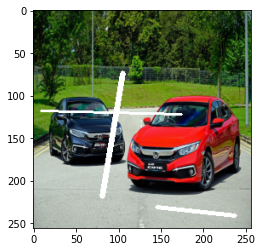

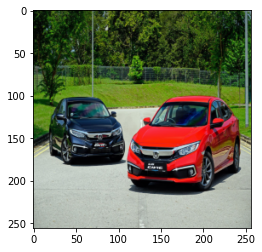

In [21]:
input_image, target_image = load(LHR_TRAIN_DATA_PATH+'/0.png')
print(input_image.shape)
print(target_image.shape)


# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(input_image/255.0)
plt.figure()
plt.imshow(target_image/255.0)

In [22]:
# normalizing the images to [-1, 1]
def normalize(input_image, target_image):
    input_image  = (input_image / 127.5) - 1
    target_image = (target_image / 127.5) - 1

    return input_image, target_image


def load_image_train(image_file):
    input_image, target_image = load(image_file)
    input_image, target_image = normalize(input_image, target_image)

    return input_image, target_image

def load_image_test(image_file):
    input_image, target_image = load(image_file)
    input_image, target_image = normalize(input_image, target_image)

    return input_image, target_image

In [23]:
# train_dataset
train_dataset = tf.data.Dataset.list_files(LHR_TRAIN_DATA_PATH + '/*.png')
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(1)

# test_dataset
test_dataset = tf.data.Dataset.list_files(LHR_VAL_DATA_PATH + '/*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

In [24]:
def generator_loss(fake, target):
    l1_loss = tf.reduce_mean(tf.abs(fake-target))
    
    return l1_loss

def evaluate(model, epoch):  
    psnr_mean = 0.0
    count = 0
    for inputs, targets in test_dataset:
        fake = model([inputs], training=True)
         
        psnr = tf.image.psnr(fake*0.5 + 0.5, targets*0.5 + 0.5, max_val=1.0)

        __psnr_mean = tf.math.reduce_mean(psnr)
        # psnr_mean = psnr_mean_l
        
        psnr_mean += __psnr_mean
        count =count + 1
    
    psnr_mean = psnr_mean/count
    print('-------- psnr: ', psnr_mean.numpy(), '   ----- epoch: ', epoch, '  count: ', count)
    
    return psnr_mean
    
def generate_images(model, inputs, targets):
    fake = model([inputs], training=True)
    plt.figure(figsize=(15,20))
    
    display_list = [inputs[0], targets[0], fake[0]]
    title = ['Input', 'Real', 'Predicted']    

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()       

## Train

In [25]:
build_unet = BuildUnet()
unet_model = build_unet.build_model()

Inp_unet_model = unet_model
Inp_unet_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_48 (Conv2D)             (None, 256, 256, 64  192         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_25 (BatchN  (None, 256, 256, 64  256        ['conv2d_48[0][0]']              
 ormalization)                  )                                                           

In [26]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

@tf.function
def train_step(inputs, targets):
    with tf.GradientTape() as tape:
        # output
        fake = Inp_unet_model([inputs], training=True)     
        loss = generator_loss(fake, targets)
        

    generator_gradients = tape.gradient(loss, Inp_unet_model.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients, Inp_unet_model.trainable_variables))
    
    return loss

    
    
def fit(train_ds, epochs, test_ds):
    best_pnsr = 0.0
    for epoch in range(epochs):
        # Train
        total_loss = 0.0
        for inputs, targets in train_ds:
            loss = train_step(inputs, targets)
            total_loss = total_loss + loss
        total_loss = total_loss/400
        print('epoch: {}   loss: {}'.format(epoch, total_loss))
        
        pnsr = evaluate(Inp_unet_model, epoch)        
        if best_pnsr < pnsr:
            best_pnsr = pnsr
            
            for inputs, targets in test_ds.take(1):
                generate_images(Inp_unet_model, inputs, targets)


epoch: 0   loss: 0.44644495844841003
-------- psnr:  16.444763    ----- epoch:  0   count:  170


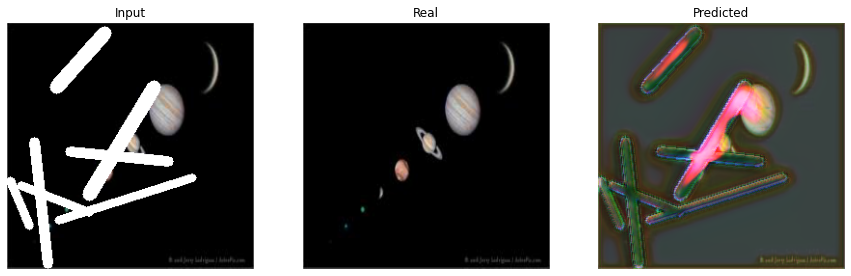

epoch: 1   loss: 0.3348446190357208
-------- psnr:  17.084784    ----- epoch:  1   count:  170


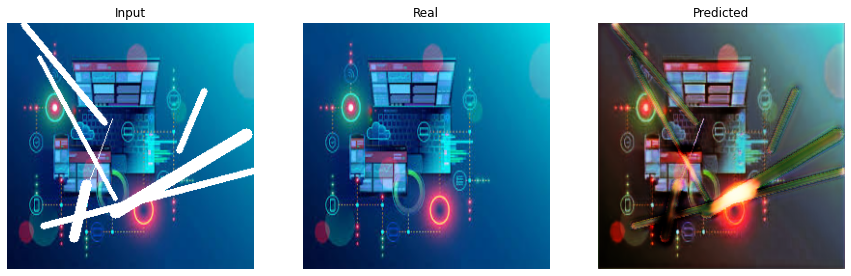

epoch: 2   loss: 0.30821457505226135
-------- psnr:  18.70452    ----- epoch:  2   count:  170


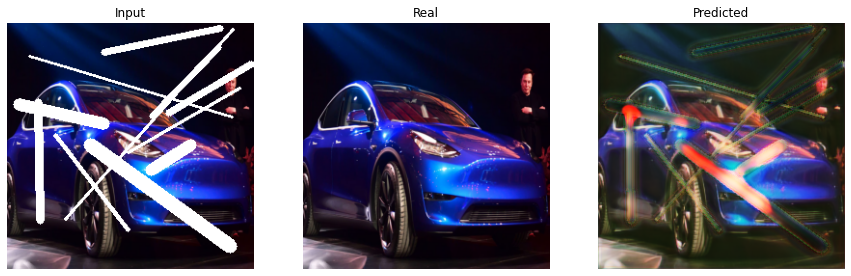

epoch: 3   loss: 0.2834523916244507
-------- psnr:  19.71639    ----- epoch:  3   count:  170


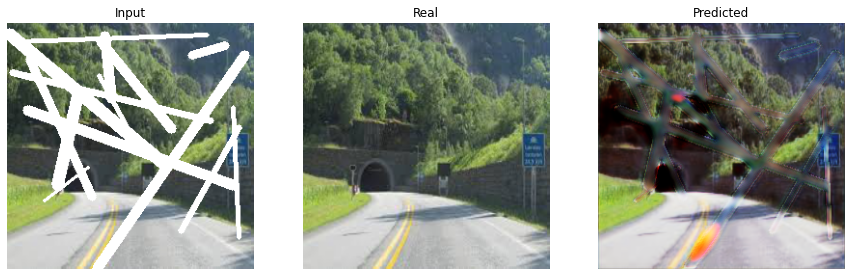

epoch: 4   loss: 0.2672228515148163
-------- psnr:  17.161367    ----- epoch:  4   count:  170
epoch: 5   loss: 0.2607421576976776
-------- psnr:  20.302528    ----- epoch:  5   count:  170


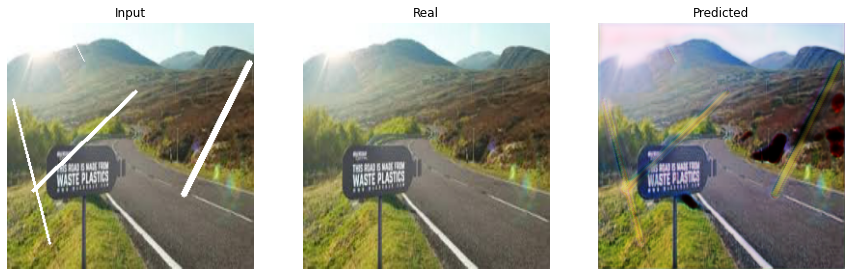

epoch: 6   loss: 0.24190093576908112
-------- psnr:  20.305048    ----- epoch:  6   count:  170


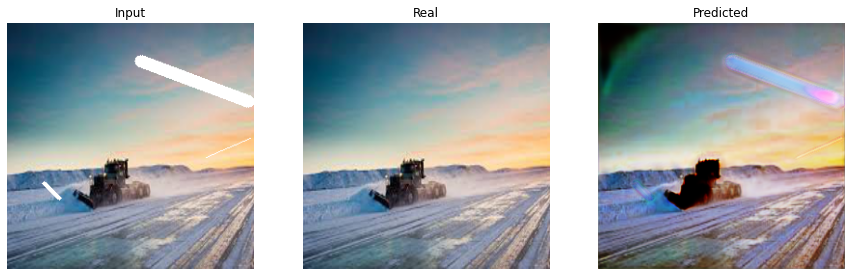

epoch: 7   loss: 0.23877157270908356
-------- psnr:  20.225754    ----- epoch:  7   count:  170
epoch: 8   loss: 0.22720593214035034
-------- psnr:  21.19976    ----- epoch:  8   count:  170


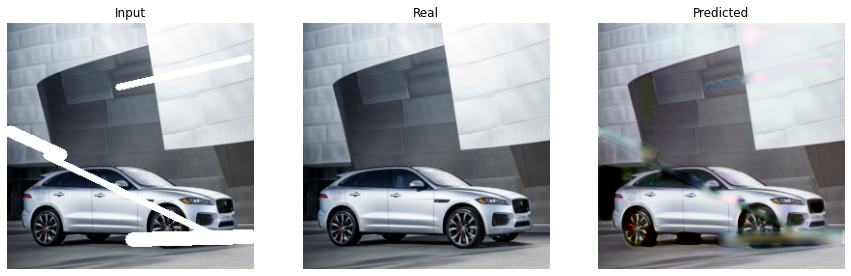

epoch: 9   loss: 0.22276362776756287
-------- psnr:  20.859901    ----- epoch:  9   count:  170
epoch: 10   loss: 0.21839600801467896
-------- psnr:  21.184656    ----- epoch:  10   count:  170
epoch: 11   loss: 0.21241113543510437
-------- psnr:  21.56027    ----- epoch:  11   count:  170


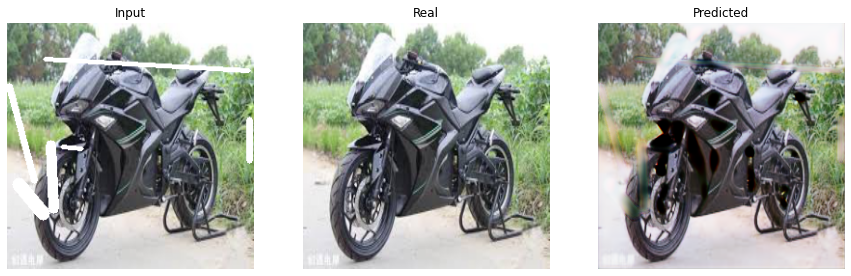

epoch: 12   loss: 0.20814579725265503
-------- psnr:  21.032972    ----- epoch:  12   count:  170
epoch: 13   loss: 0.20347562432289124
-------- psnr:  21.403492    ----- epoch:  13   count:  170
epoch: 14   loss: 0.20096327364444733
-------- psnr:  21.32769    ----- epoch:  14   count:  170
epoch: 15   loss: 0.1938512772321701
-------- psnr:  21.63267    ----- epoch:  15   count:  170


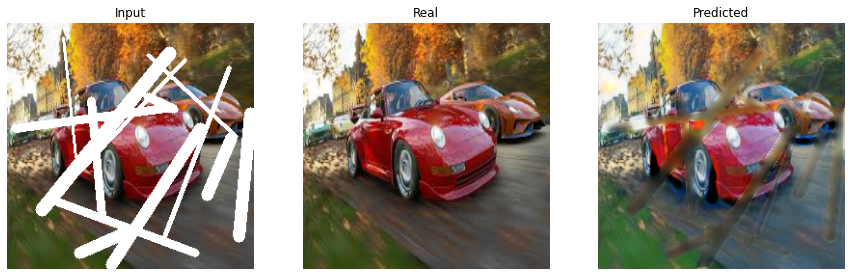

epoch: 16   loss: 0.19196072220802307
-------- psnr:  21.680325    ----- epoch:  16   count:  170


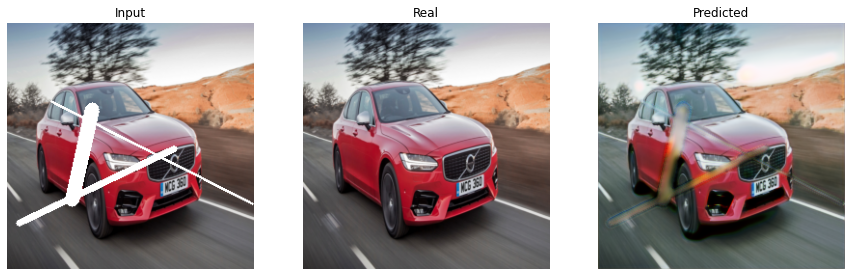

epoch: 17   loss: 0.19312411546707153
-------- psnr:  22.027096    ----- epoch:  17   count:  170


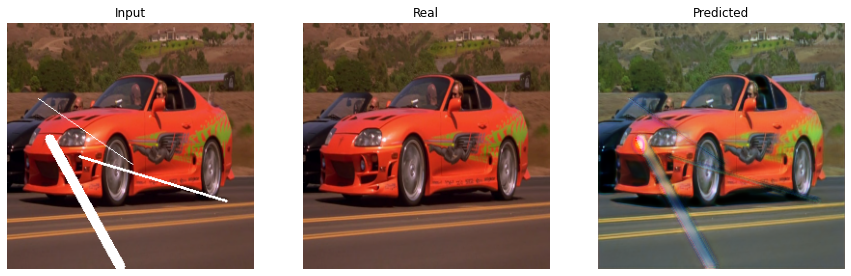

epoch: 18   loss: 0.18577897548675537
-------- psnr:  21.765463    ----- epoch:  18   count:  170
epoch: 19   loss: 0.18617624044418335
-------- psnr:  22.117043    ----- epoch:  19   count:  170


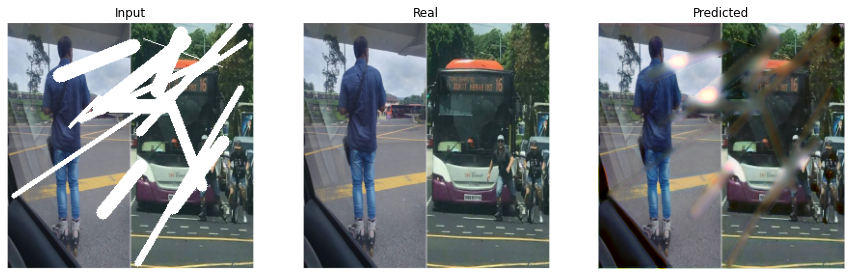

epoch: 20   loss: 0.18407657742500305
-------- psnr:  22.170164    ----- epoch:  20   count:  170


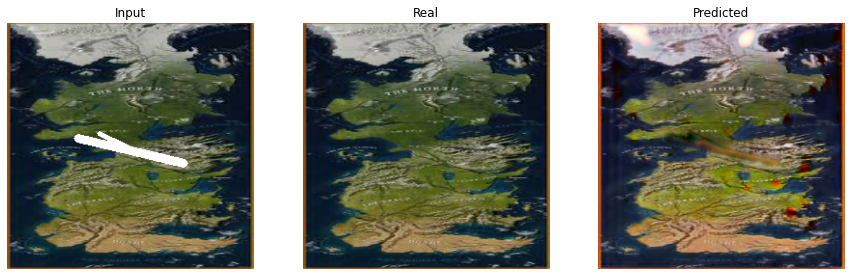

epoch: 21   loss: 0.1792694628238678
-------- psnr:  22.219643    ----- epoch:  21   count:  170


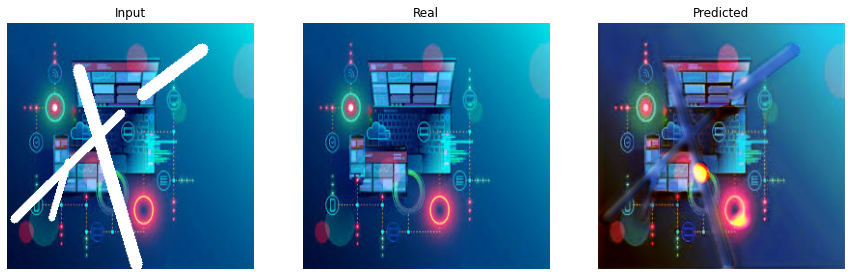

epoch: 22   loss: 0.17809313535690308
-------- psnr:  21.185963    ----- epoch:  22   count:  170
epoch: 23   loss: 0.1776425689458847
-------- psnr:  22.59487    ----- epoch:  23   count:  170


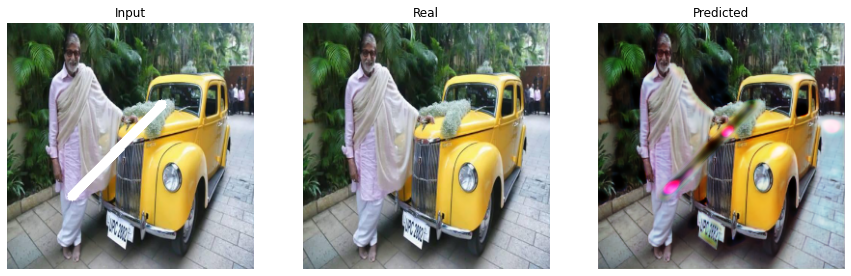

epoch: 24   loss: 0.17425470054149628
-------- psnr:  22.468843    ----- epoch:  24   count:  170
epoch: 25   loss: 0.17030824720859528
-------- psnr:  22.945707    ----- epoch:  25   count:  170


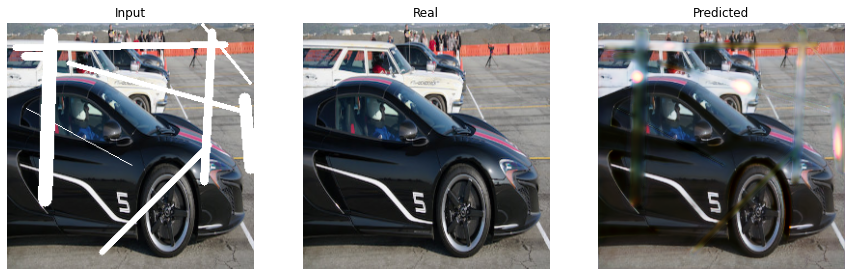

epoch: 26   loss: 0.1718401163816452
-------- psnr:  22.91338    ----- epoch:  26   count:  170
epoch: 27   loss: 0.1684950888156891
-------- psnr:  22.217676    ----- epoch:  27   count:  170
epoch: 28   loss: 0.16736358404159546
-------- psnr:  22.676075    ----- epoch:  28   count:  170
epoch: 29   loss: 0.16624286770820618
-------- psnr:  22.880709    ----- epoch:  29   count:  170
epoch: 30   loss: 0.16492439806461334
-------- psnr:  23.146793    ----- epoch:  30   count:  170


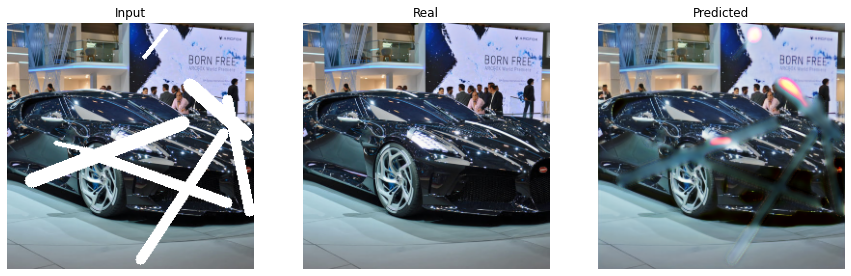

epoch: 31   loss: 0.15845085680484772
-------- psnr:  22.922022    ----- epoch:  31   count:  170
epoch: 32   loss: 0.16024938225746155
-------- psnr:  22.741037    ----- epoch:  32   count:  170
epoch: 33   loss: 0.15788207948207855
-------- psnr:  22.932209    ----- epoch:  33   count:  170
epoch: 34   loss: 0.15581360459327698
-------- psnr:  22.669762    ----- epoch:  34   count:  170
epoch: 35   loss: 0.1563068926334381
-------- psnr:  22.35707    ----- epoch:  35   count:  170
epoch: 36   loss: 0.155422642827034
-------- psnr:  23.12111    ----- epoch:  36   count:  170
epoch: 37   loss: 0.15257467329502106
-------- psnr:  23.214752    ----- epoch:  37   count:  170


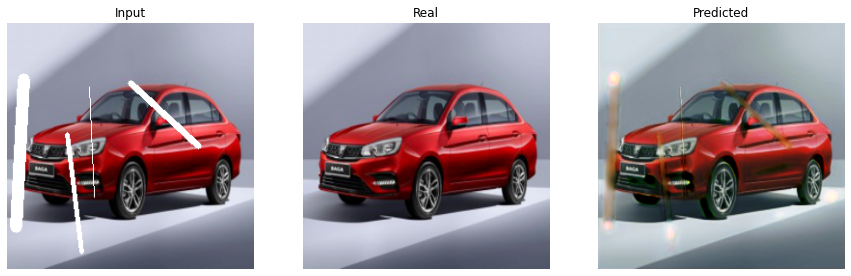

epoch: 38   loss: 0.15312689542770386
-------- psnr:  23.47224    ----- epoch:  38   count:  170


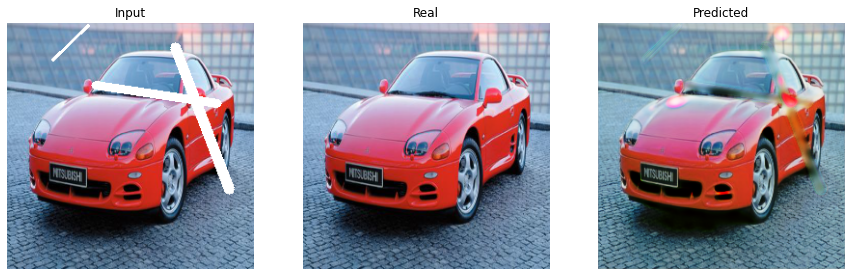

epoch: 39   loss: 0.14722426235675812
-------- psnr:  23.203133    ----- epoch:  39   count:  170
epoch: 40   loss: 0.15084251761436462
-------- psnr:  23.693996    ----- epoch:  40   count:  170


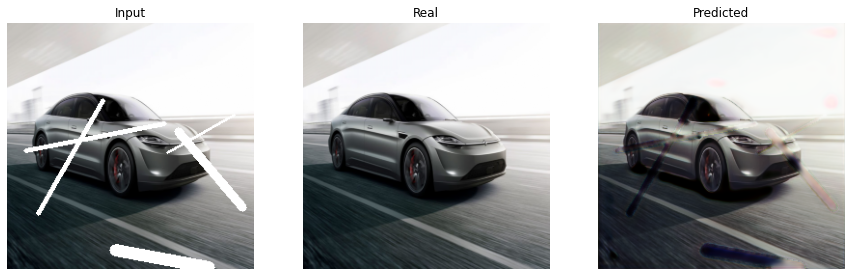

epoch: 41   loss: 0.15021459758281708
-------- psnr:  23.08915    ----- epoch:  41   count:  170
epoch: 42   loss: 0.14383161067962646
-------- psnr:  23.195673    ----- epoch:  42   count:  170
epoch: 43   loss: 0.1450817584991455
-------- psnr:  22.735973    ----- epoch:  43   count:  170
epoch: 44   loss: 0.14512529969215393
-------- psnr:  22.846287    ----- epoch:  44   count:  170
epoch: 45   loss: 0.1464042067527771
-------- psnr:  22.968306    ----- epoch:  45   count:  170
epoch: 46   loss: 0.14299823343753815
-------- psnr:  23.41661    ----- epoch:  46   count:  170
epoch: 47   loss: 0.14167533814907074
-------- psnr:  23.59536    ----- epoch:  47   count:  170
epoch: 48   loss: 0.14193099737167358
-------- psnr:  23.424706    ----- epoch:  48   count:  170
epoch: 49   loss: 0.14020738005638123
-------- psnr:  23.51442    ----- epoch:  49   count:  170
epoch: 50   loss: 0.14185237884521484
-------- psnr:  23.085999    ----- epoch:  50   count:  170
epoch: 51   loss: 0.137724

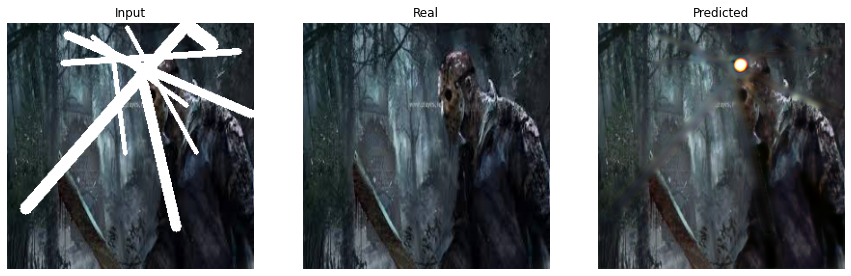

epoch: 55   loss: 0.1341588795185089
-------- psnr:  24.023645    ----- epoch:  55   count:  170


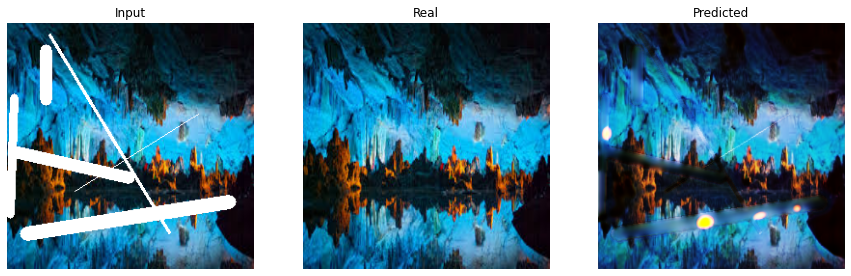

epoch: 56   loss: 0.13580018281936646
-------- psnr:  24.052755    ----- epoch:  56   count:  170


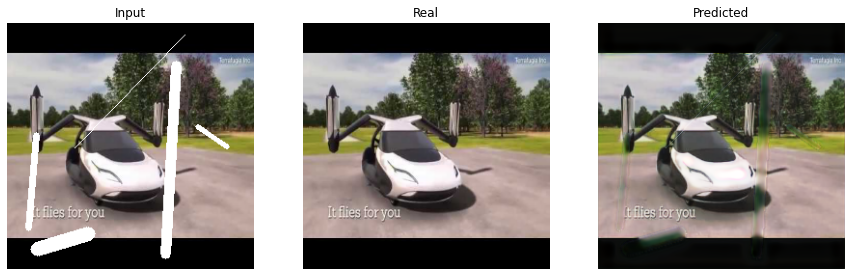

epoch: 57   loss: 0.13428756594657898
-------- psnr:  23.941093    ----- epoch:  57   count:  170
epoch: 58   loss: 0.13151898980140686
-------- psnr:  23.417812    ----- epoch:  58   count:  170
epoch: 59   loss: 0.1308588981628418
-------- psnr:  23.786919    ----- epoch:  59   count:  170
epoch: 60   loss: 0.13303370773792267
-------- psnr:  23.782719    ----- epoch:  60   count:  170
epoch: 61   loss: 0.12848539650440216
-------- psnr:  23.673826    ----- epoch:  61   count:  170
epoch: 62   loss: 0.1331184357404709
-------- psnr:  23.93856    ----- epoch:  62   count:  170
epoch: 63   loss: 0.12724542617797852
-------- psnr:  24.261442    ----- epoch:  63   count:  170


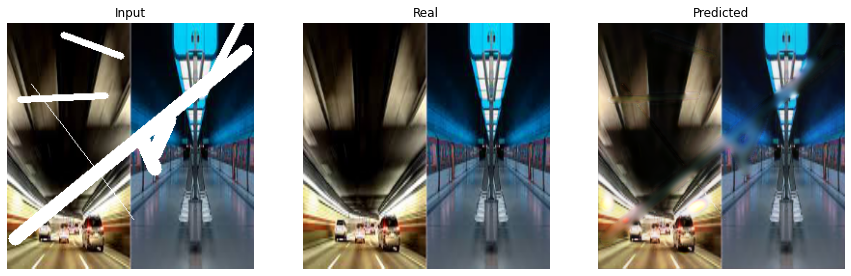

epoch: 64   loss: 0.12952376902103424
-------- psnr:  23.160904    ----- epoch:  64   count:  170
epoch: 65   loss: 0.12853358685970306
-------- psnr:  23.900002    ----- epoch:  65   count:  170
epoch: 66   loss: 0.12735934555530548
-------- psnr:  24.063221    ----- epoch:  66   count:  170
epoch: 67   loss: 0.12838254868984222
-------- psnr:  24.223928    ----- epoch:  67   count:  170
epoch: 68   loss: 0.12478312849998474
-------- psnr:  23.917236    ----- epoch:  68   count:  170
epoch: 69   loss: 0.12486696988344193
-------- psnr:  23.971935    ----- epoch:  69   count:  170
epoch: 70   loss: 0.12431102991104126
-------- psnr:  23.74945    ----- epoch:  70   count:  170
epoch: 71   loss: 0.12418927252292633
-------- psnr:  23.746939    ----- epoch:  71   count:  170
epoch: 72   loss: 0.12433038651943207
-------- psnr:  23.970251    ----- epoch:  72   count:  170
epoch: 73   loss: 0.12289281189441681
-------- psnr:  23.886105    ----- epoch:  73   count:  170
epoch: 74   loss: 0.1

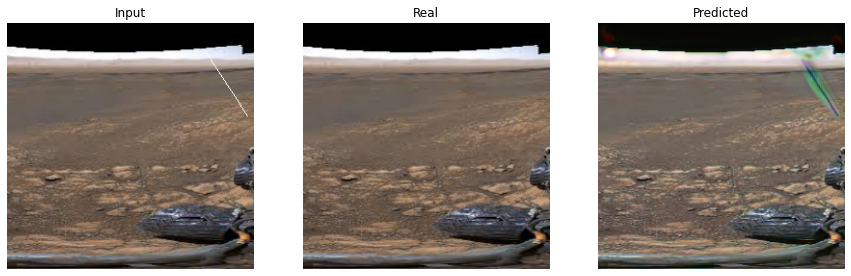

epoch: 78   loss: 0.11900335550308228
-------- psnr:  24.14705    ----- epoch:  78   count:  170
epoch: 79   loss: 0.11736296862363815
-------- psnr:  24.37743    ----- epoch:  79   count:  170
epoch: 80   loss: 0.12016067653894424
-------- psnr:  23.114668    ----- epoch:  80   count:  170
epoch: 81   loss: 0.11897897720336914
-------- psnr:  24.146791    ----- epoch:  81   count:  170
epoch: 82   loss: 0.11876275390386581
-------- psnr:  23.836306    ----- epoch:  82   count:  170
epoch: 83   loss: 0.11543723195791245
-------- psnr:  24.505898    ----- epoch:  83   count:  170


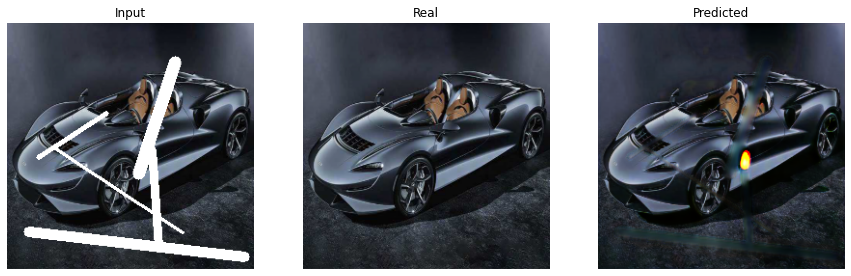

epoch: 84   loss: 0.11581891775131226
-------- psnr:  24.579098    ----- epoch:  84   count:  170


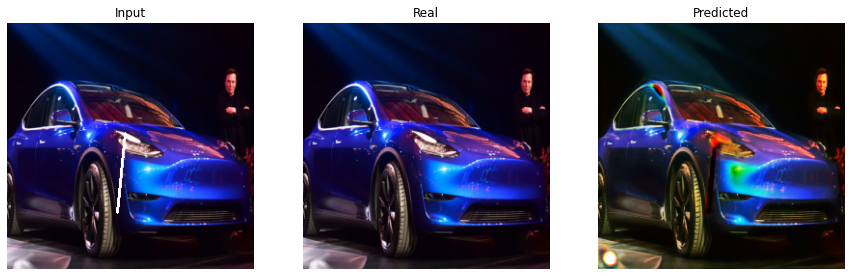

epoch: 85   loss: 0.11658085137605667
-------- psnr:  24.116484    ----- epoch:  85   count:  170
epoch: 86   loss: 0.11440093070268631
-------- psnr:  23.947794    ----- epoch:  86   count:  170
epoch: 87   loss: 0.11405561119318008
-------- psnr:  24.291492    ----- epoch:  87   count:  170
epoch: 88   loss: 0.11398229748010635
-------- psnr:  24.551016    ----- epoch:  88   count:  170
epoch: 89   loss: 0.11334656924009323
-------- psnr:  24.176014    ----- epoch:  89   count:  170
epoch: 90   loss: 0.1123630702495575
-------- psnr:  24.353287    ----- epoch:  90   count:  170
epoch: 91   loss: 0.1136782094836235
-------- psnr:  24.438744    ----- epoch:  91   count:  170
epoch: 92   loss: 0.11275400221347809
-------- psnr:  24.531788    ----- epoch:  92   count:  170
epoch: 93   loss: 0.1126486212015152
-------- psnr:  24.025688    ----- epoch:  93   count:  170
epoch: 94   loss: 0.11149556189775467
-------- psnr:  24.59672    ----- epoch:  94   count:  170


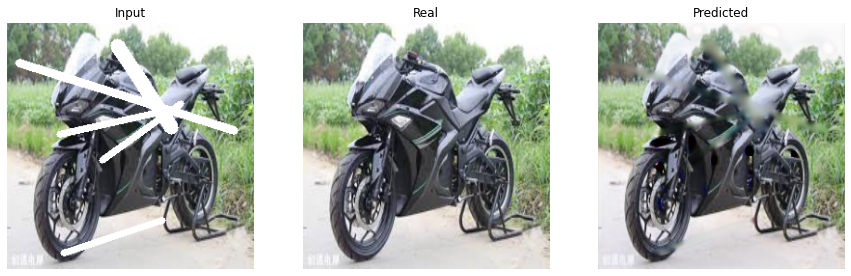

epoch: 95   loss: 0.11124535650014877
-------- psnr:  24.676725    ----- epoch:  95   count:  170


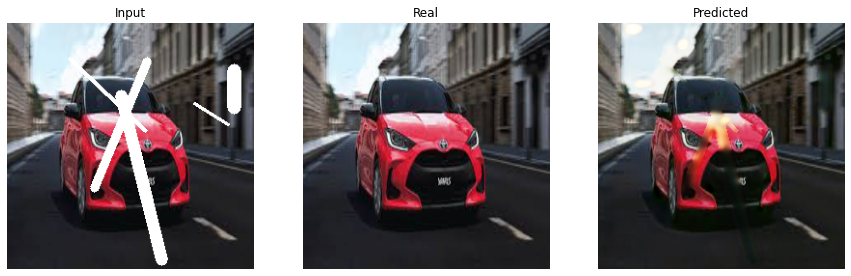

epoch: 96   loss: 0.1124773919582367
-------- psnr:  24.479588    ----- epoch:  96   count:  170
epoch: 97   loss: 0.11042390763759613
-------- psnr:  24.380917    ----- epoch:  97   count:  170
epoch: 98   loss: 0.11051620543003082
-------- psnr:  24.500278    ----- epoch:  98   count:  170
epoch: 99   loss: 0.10998106747865677
-------- psnr:  24.612494    ----- epoch:  99   count:  170


In [27]:
EPOCHS = 100
fit(train_dataset, EPOCHS, test_dataset)

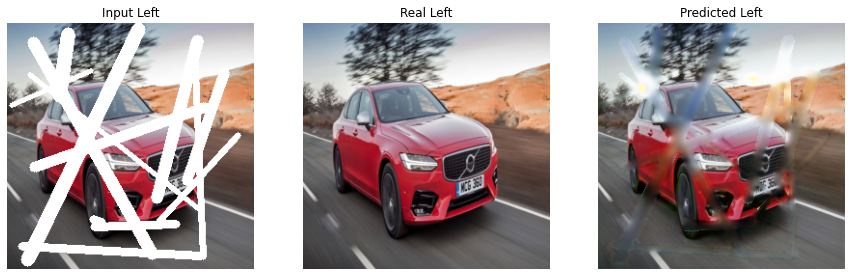

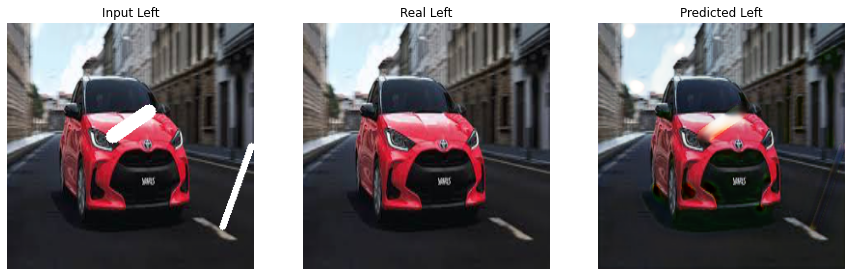

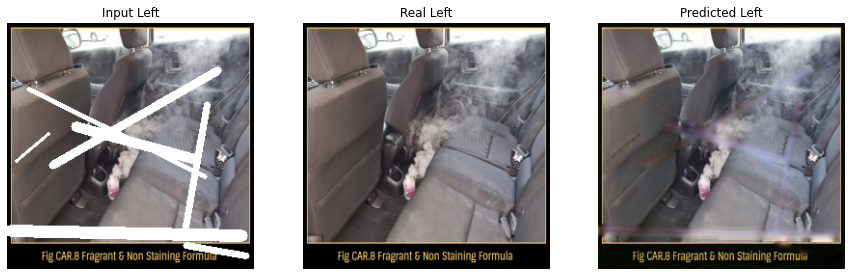

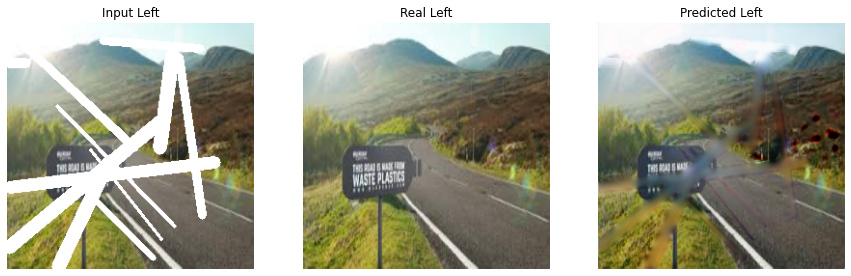

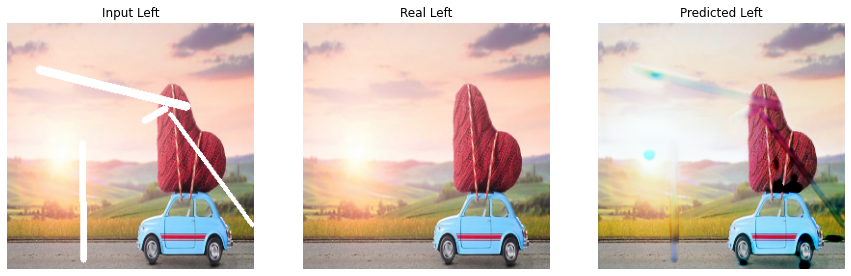

In [28]:
for _ in range(5):
    for inputs, targets in test_dataset.take(1):
        fake = Inp_unet_model([inputs], training=True)
        plt.figure(figsize=(15,20))

        display_list = [inputs[0], targets[0], fake[0]]
        title = ['Input Left', 'Real Left', 'Predicted Left']    

        
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
            plt.axis('off')
        plt.show() 